# MLM states example

## Import packages

The code for computing and plotting background states is contained in the package atmosphere_bgs.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pathlib
import atmosphere_bgs

## Load the input data

The input data defines the source domain, with coordinates $(s,p)$, and the target measure, in coordinates $(z,\theta)$, of the optimal transport problem. The target measure is a discretisation of the true mass density in $(z,\theta)$ space. This implementation gives two options for how to define this discretisation.

1. Direct mapping of masses from $(q,\theta)$ space in to $(z,\theta)$ space. For this, define ```nextra```, the number of extra columns of points in $(z,\theta)$ space, and set ```interpolate=False```.
2. Linear interpolation of masses on $\theta$-surfaces in stretched variable. This the default (```interpolate=True```), and the number of intervals used for the linear interpolation on each isentropic surface above ground is specified by ```ny```, whose default value is the number of discrete latitudes are present in the data.

In either case, the minimum pressure value (which should be positive) is set by specifying ```pmin```.

In [2]:
input_path = pathlib.Path("./input_data/full_data_sets/bs_lc1low2001010000")
#input_path = pathlib.Path("./input_data/full_data_sets/bs_lc2high2001010400")
#input_path = pathlib.Path("./input_data/full_data_sets/bs_diout2010012218")
interpolate=True
ny = None
nextra = 0
pmin =10
input_data = atmosphere_bgs.DataLoader(input_path, pmin=pmin, nextra=nextra, ny=ny, interpolate=interpolate)

Number of intervals in interpolation:  256


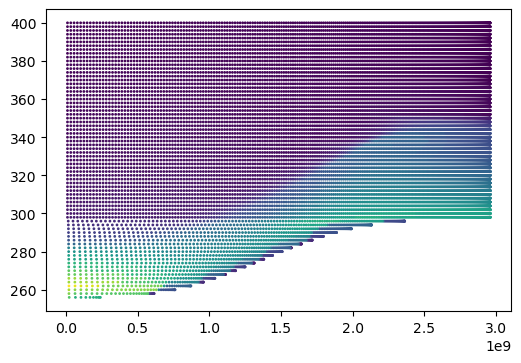

In [3]:
y = input_data.y
tmn = input_data.tmn
if interpolate is True:
    print('Number of intervals in interpolation: ', input_data.ny)

plt.figure(dpi=100)
plt.scatter(y[:,0],y[:,1],s=1,c=tmn)

## Get the energy minimising MLM state by solving optimal transport problem

To solve for the energy minimising MLM state:

1. define a solver class ```bgs``` by passing the input data to ```atmosphere_bgs.OTSolver```;
2. solve by calling the method ```get_bgs```; this will automatically add the optimal Laguerre tessellation as an attribute to the solver class, which can be used for plotting.

Physical parameters that are fixed and define the cost function have default values defined in the C++ source code.

The extent of the physical domain in $(s,p)$ coordinates is set depending on the input data:

- ```smin```: set to the minimum sine latitude value;
- ```smax```: set to the maximum sine latitude value;
- ```pmin```: defined when loading the input data;
- ```pmax```: default is 1.4 times the reference pressure (this is $141855$).

In addition, there are other simulation parameters that determine to what precision the Laguerre diagrams are constructed. These have default values: ```boundary_res``` = 2000, ```area_tolerance``` = 2e-05, ```max_refine_steps``` = 1000, ```line_tolerance``` = 0.0001, ```min_line_resolution``` = 5, ```max_line_resolution``` = 100.

A relative area tolerance ```ot_tol``` can be passed to the optimal transport solver. The default value is ```1e-4```.

In [4]:
ot_tol = 1e-4 # relative area tolerance for the optimal transport solver; default is 1e-4
bgs = atmosphere_bgs.OTSolver(input_data,ot_tol) # initialise solver class
bgs.get_bgs(verbose=True) # solve the optimal transport problem to get the background state

initial duals calculated
try to fix 0 bad areas
it=-1, lr=1.00e-05, good_areas=14790/14790
it=0, lr=2.00e-05, good_areas=14790/14790, meanerr=2.931384e+00, l2err = 1.058663e+04, max_err=9.750091e+03
it=1, lr=4.00e-05, good_areas=14790/14790, meanerr=2.931265e+00, l2err = 1.058621e+04, max_err=9.749701e+03
it=2, lr=8.00e-05, good_areas=14790/14790, meanerr=2.931002e+00, l2err = 1.058536e+04, max_err=9.748921e+03
it=3, lr=1.60e-04, good_areas=14790/14790, meanerr=2.930532e+00, l2err = 1.058367e+04, max_err=9.747361e+03
it=4, lr=3.20e-04, good_areas=14790/14790, meanerr=2.929594e+00, l2err = 1.058028e+04, max_err=9.744240e+03
it=5, lr=6.40e-04, good_areas=14790/14790, meanerr=2.927712e+00, l2err = 1.057350e+04, max_err=9.738000e+03
it=6, lr=1.28e-03, good_areas=14790/14790, meanerr=2.923959e+00, l2err = 1.055995e+04, max_err=9.725519e+03
it=7, lr=2.56e-03, good_areas=14790/14790, meanerr=2.916439e+00, l2err = 1.053284e+04, max_err=9.700556e+03
it=8, lr=5.12e-03, good_areas=14790/14790, me

## Get rasterized (i.e. gridded) values

In [5]:
ld = bgs.ld
zvals = bgs.y[:,0]
thvals = bgs.y[:,1]

In [6]:
rast = ld.get_rasterizer()
res = [10,10]

zvals = np.concatenate([zvals, [np.nan]])
thvals = np.concatenate([thvals, [np.nan]])

z_grid = rast.rasterize(zvals, res).copy()
th_grid = rast.rasterize(zvals, res).copy()

print(z_grid.shape)
print(th_grid.shape)

fixed 4 intersects
(10, 10)
(10, 10)


## Plot results
The main plotting function is ```atmosphere_bgs.plot_lag_tess```. It takes a Laguerre cell class ```ld``` and a vector of values ```val``` for each Laguerre cell (e.g. potential temperature) and plots the corresponding Laguerre tessellation with colour corresponding to ```val```. The optimal Laguerre tessellation found by solving the optimal transport problem with given  data is automatically saved as an attribute of the solver class, here called ```bgs```.

Independent, continuous, injective transformations of the axes can be passed as ```transform```. Below this is done with the transformation
$$
(s,p)\mapsto (\phi,z) = \left(\arcsin(s),-H\ln\left(\frac{p}{p_{00}}\right)\right),
$$
where $H=6500$.

By default values, are set to be constant on each Laguerre cell. If a non-zero bandwidth ```bw``` is passed then the rasterized values are smoothed (in the transformed coordinates if specified) using a Gaussian kernel via the function ```gaussian_filter``` imported from the package ```scipy.ndimage```.

The rasterized values ```rv``` and current axes ```ax``` are returned. The resolution of the rasterization can be specified by passing ```res``` to the plotting function. The default value is ```res=[1000,1000]```, which specifies a $1000$x$1000$ grid.

### Define transformation from $(s,p)$ to $(\phi,z)$

In [7]:
transform = lambda x : [np.rad2deg(np.arcsin(x[0])), -6500*np.log(x[1]/bgs.pp.p00)]

In [8]:
# Arguments for plotting in (s,p) and (lat,z) space
kwargs_s_p = {'ld' : bgs.ld, 'plot_lines' : True, 'background' : True, 'invert_yaxis' : True}
kwargs_lat_z = {'ld' : bgs.ld, 'transform' : transform, 'bw' : 30, 'contour_levels' : 10,
                'plot_lines' : False, 'background' : True, 'invert_yaxis' : False}

### Plot velocity (piecewise constant and smoothed)

The velocities at Laguerre cell centroids are computed by passing the Laguerre diagram to the function ```atmosphere_bgs.get_u```. This returns a vector of values with each component being the $u$ value of the corresponding cell centroid.

In [9]:
# Compute velocity at cell centroids
u = atmosphere_bgs.get_u(bgs.ld)

fixed 4 intersects


Text(0, 0.5, '$p$')

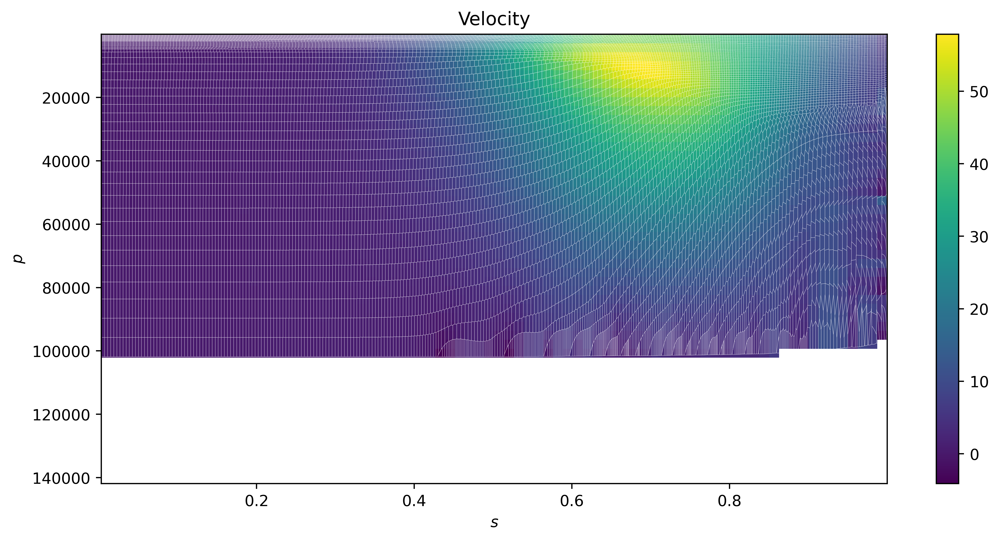

In [10]:
# Example with low resolution
rv, ax = atmosphere_bgs.plot_lag_tess(val=u, res=[80,50], title='Velocity', **kwargs_s_p)
ax.set_xlabel('$s$')
ax.set_ylabel('$p$')

fixed 4 intersects
fixed 4 intersects


Text(0, 0.5, '$z$')

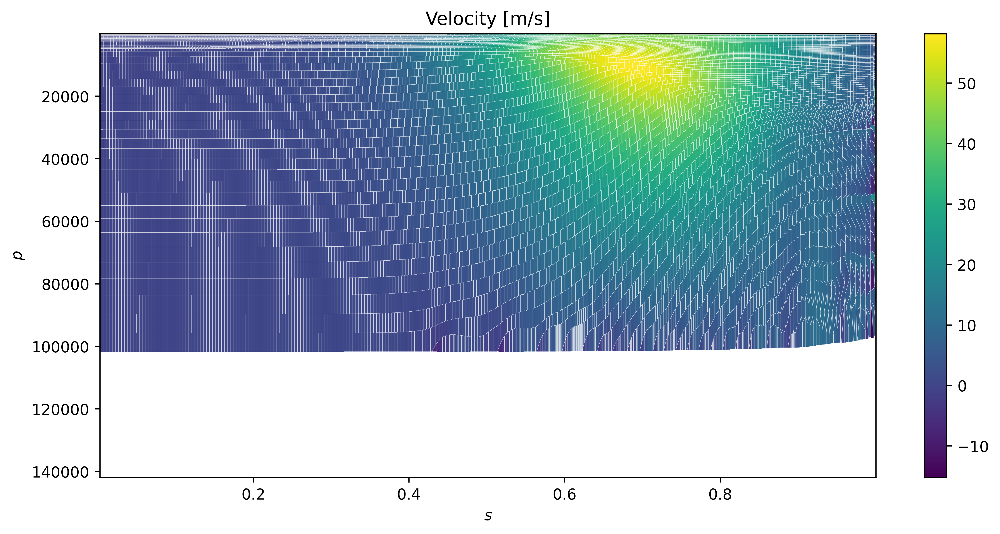

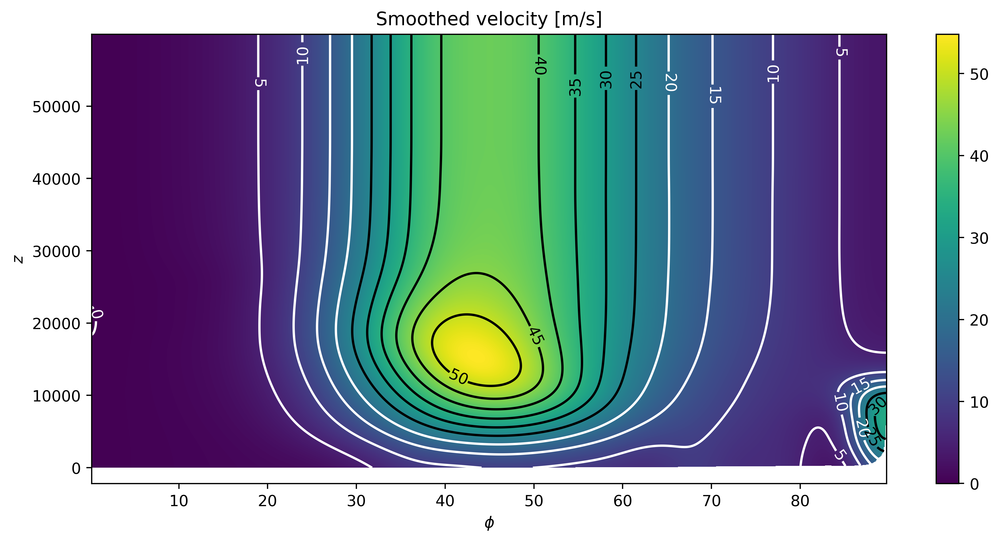

In [11]:
rv, ax = atmosphere_bgs.plot_lag_tess(val=u, title='Velocity [m/s]', **kwargs_s_p)
ax.set_xlabel('$s$')
ax.set_ylabel('$p$')
rv, ax = atmosphere_bgs.plot_lag_tess(val=u, title='Smoothed velocity [m/s]', **kwargs_lat_z)
ax.set_xlabel('$\phi$')
ax.set_ylabel('$z$')

### Plot zonal angular momentum (piecewise constant and smoothed)

The zonal angular momentum values are the first coordinates of the 'seed' positions ```bgs.y```.

fixed 4 intersects
fixed 4 intersects


Text(0, 0.5, '$z$')

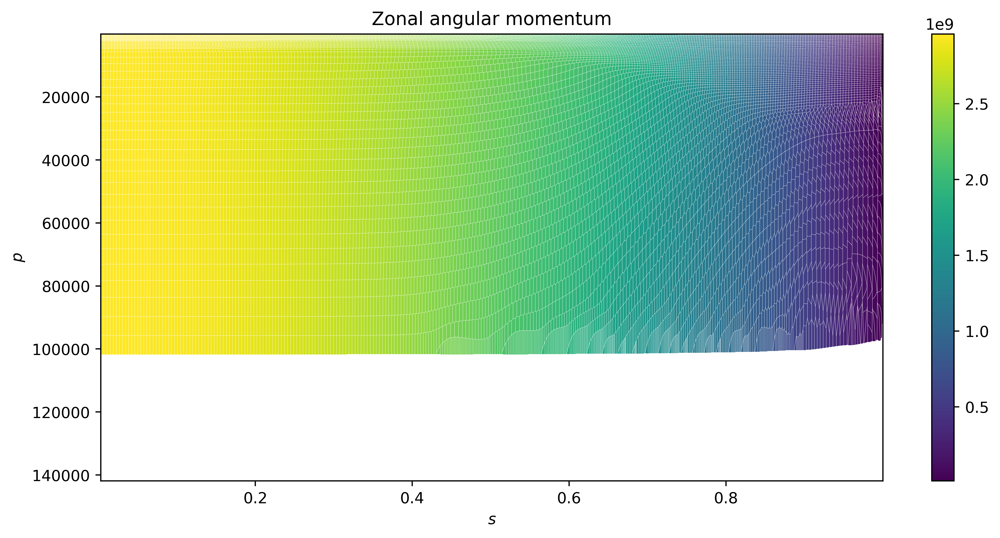

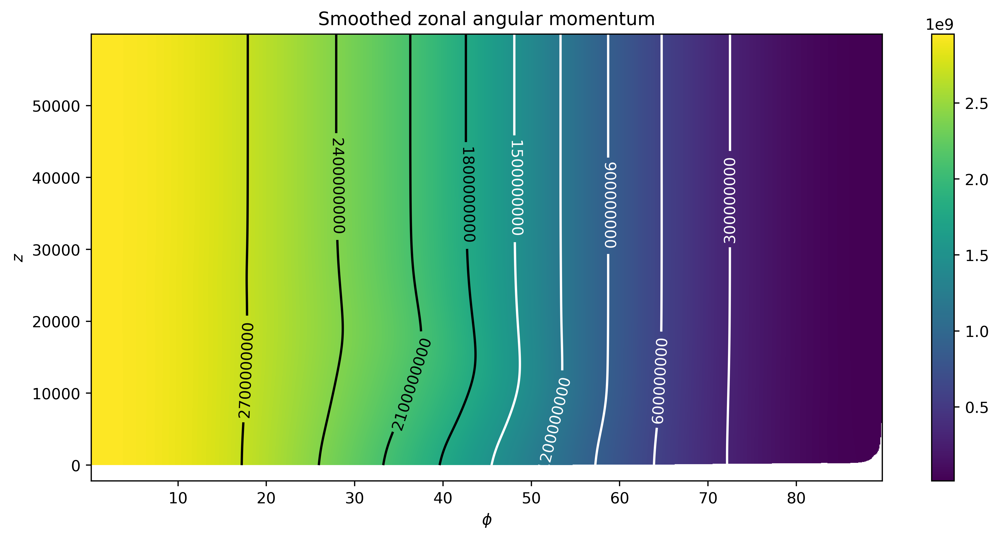

In [12]:
rv, ax = atmosphere_bgs.plot_lag_tess(val=bgs.y[:,0], title = 'Zonal angular momentum', **kwargs_s_p)
ax.set_xlabel('$s$')
ax.set_ylabel('$p$')
rv, ax = atmosphere_bgs.plot_lag_tess(val=bgs.y[:,0], title = 'Smoothed zonal angular momentum', **kwargs_lat_z)
ax.set_xlabel('$\phi$')
ax.set_ylabel('$z$')

### Plot potential temperature (piecewise constant and smoothed)

The potential temperature values are the second coordinates of the 'seed' positions ```bgs.y```.

fixed 4 intersects
fixed 4 intersects


Text(0, 0.5, '$z$')

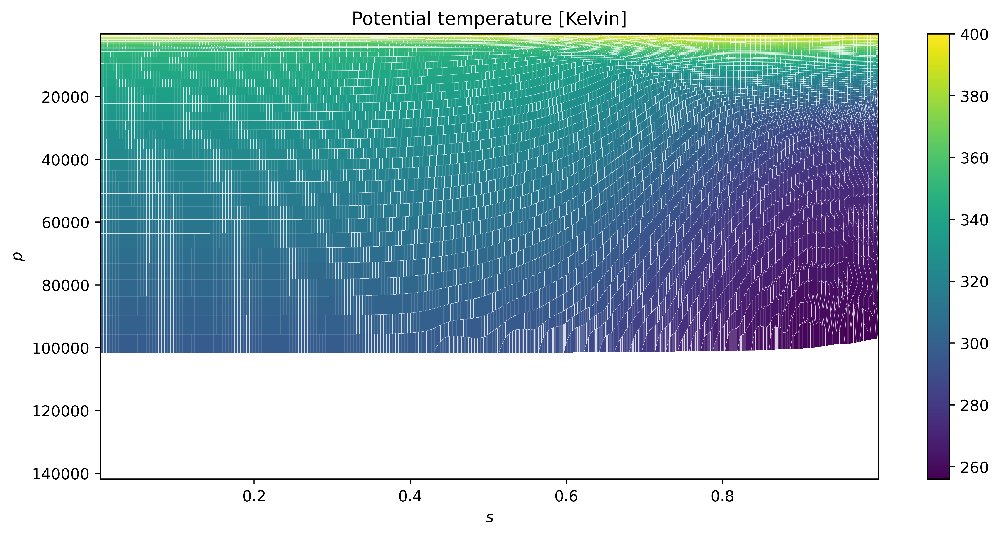

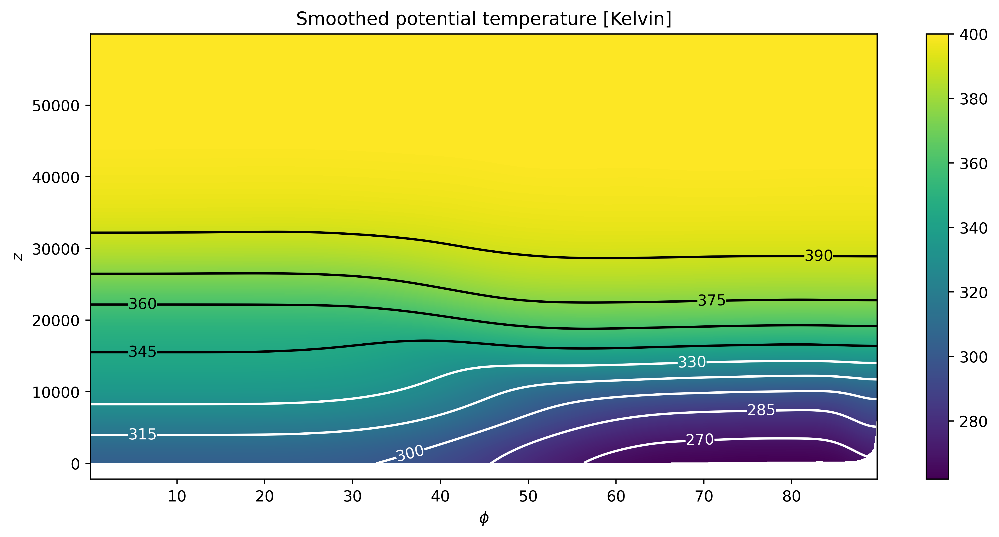

In [13]:
rv, ax = atmosphere_bgs.plot_lag_tess(val=bgs.y[:,1], title='Potential temperature [Kelvin]', **kwargs_s_p)
ax.set_xlabel('$s$')
ax.set_ylabel('$p$')
rv, ax = atmosphere_bgs.plot_lag_tess(val=bgs.y[:,1], title='Smoothed potential temperature [Kelvin]', **kwargs_lat_z)
ax.set_xlabel('$\phi$')
ax.set_ylabel('$z$')